# Camera calibration

- In this section, I wanna calibrate the camera to get the camera matrix:<img src="cameraMatrix.png" width="200" height="200"> based on the opencv Camera Calibration template.


- in this version, I'm going to change the gaussian distribution of mask in spherical warping function.

In [103]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import math

In [104]:
# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 26, 0.001)
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.
images = glob.glob('img/*.jpg')


for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    cv2.imshow('gray',gray)
    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    # If found, add object points, image points (after refining them)
    print(ret)
    if ret == True:
        objpoints.append(objp)
        corners2=cv2.cornerSubPix(gray,corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners2, ret)
        cv2.imshow('img', img)
        cv2.waitKey(500)
cv2.destroyAllWindows()

True
True
True
True
True
True
True
True
True
True
True


In [105]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
print(mtx)
K= mtx

[[3.60700612e+03 0.00000000e+00 1.46342552e+03]
 [0.00000000e+00 3.56688419e+03 1.92973393e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [4]:
def cylindricalWarpImage(img1, K, savefig):
    fx = K[0,0]
    fy = K[1,1]
    (im_h,im_w) = img1.shape[:2]

    # go inverse from cylindrical coord to the image
    # (this way there are no gaps)
    cyl = np.zeros_like(img1)
    cyl_mask = np.zeros_like(img1)
    (cyl_h,cyl_w) = cyl.shape[:2]
    
    x_c = K[0,2]
    y_c = K[1,2]
#     x_c = float(cyl_w) / 2.0
#     y_c = float(cyl_h) / 2.0
    for x_cyl in np.arange(0,cyl_w):
        for y_cyl in np.arange(0,cyl_h):
            theta = (x_cyl - x_c) / fx
            h     = (y_cyl - y_c) / fy

            X = np.array([math.sin(theta), h, math.cos(theta)])
            X = np.dot(K,X)
            x_im = X[0] / X[2]
            if x_im < 0 or x_im >= im_w:
                continue

            #here use offset to overcome the translation of the phi, also can use zeropadding to the img,then spherical warping
            y_im = X[1] / X[2]         
            if y_im < 0 or y_im >= im_h:
                continue

            cyl[int(y_cyl),int(x_cyl)] = img1[int(y_im),int(x_im)]
            cyl_mask[int(y_cyl),int(x_cyl)] = 255


#     if savefig:
#         plt.imshow(cyl, cmap='gray')
#         plt.savefig("cyl.png",bbox_inches='tight')

    return (cyl,cyl_mask)


In [5]:
def drawMatches(imageA, imageB, kpsA, kpsB, matches, status):
    # initialize the output visualization image
    (hA, wA) = imageA.shape[:2]
    (hB, wB) = imageB.shape[:2]
    vis = np.zeros((max(hA, hB), wA + wB, 3), dtype="uint8")
    vis[0:hA, 0:wA] = imageA
    vis[0:hB, wA:] = imageB

    # loop over the matches
    for ((trainIdx, queryIdx), s) in zip(matches, status):
        # only process the match if the keypoint was successfully
        # matched
        if s == 1:
            # draw the match
            ptA = (int(kpsA[queryIdx][0]), int(kpsA[queryIdx][1]))
            ptB = (int(kpsB[trainIdx][0]) + wA, int(kpsB[trainIdx][1]))
            cv2.line(vis, ptA, ptB, (255, 0, 0), 1)
    # return the visualization
    return vis


In [6]:
def showImages(img1,sph1):
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img1.astype(np.uint8), cv2.COLOR_BGR2RGB))
    # plt.title('spherical')
    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(sph1.astype(np.uint8), cv2.COLOR_BGR2RGB))
    # plt.title('spherical')
    plt.show()

In [26]:
def sphericalWarpImage(img1, K,theta_i,phi_i,offset,edge):
    fx = K[0,0]
    fy = K[1,1]
    x_c = K[0,2]
    y_c = K[1,2]
    #padding the image 
#     offset = math.fabs(phi_i)/math.fabs(( 0 - y_c) / fy)*fy/2
#     offset = int(offset+offset/3)
#     print(offset)
#     img1 = cv2.copyMakeBorder(img1,offset,0,100,100,cv2.BORDER_CONSTANT)

    (im_h,im_w) = img1.shape[:2]

    # go inverse from cylindrical coord to the image
    # (this way there are no gaps)

    

#     print(cyl_h)
#     print(cyl_w)


    flag = False
#while up_stitching, up_padding, down_stitching, down_padding

    if edge !=0:
        up_edge = offset
        down_edge = offset
        x_edge = edge
        cyl = np.zeros((im_h+2*offset,im_w+2*edge,3))
        cyl_mask = np.zeros((im_h+2*offset,im_w+2*edge,3))
        (cyl_h,cyl_w) = (im_h,im_w)
    else:
        cyl = np.zeros((im_h+int(math.fabs(offset)),im_w+2*int(math.fabs(offset)),3))
        cyl_mask = np.zeros((im_h+int(math.fabs(offset)),im_w+2*int(math.fabs(offset)),3))
        (cyl_h,cyl_w) = (im_h,im_w)
        if offset>0:
            up_edge = offset
            down_edge = 0
            x_edge = offset
        else:
            offset = -offset
            up_edge = 0
            down_edge = offset
            x_edge = offset
    
    print(cyl.shape)   
    
    for y_cyl in np.arange(-up_edge,im_h+down_edge):    #row
        for x_cyl in np.arange(-x_edge,im_w+x_edge):   #column
            theta = (x_cyl - x_c) / fx
            phi     =( y_cyl - y_c) / fy
    
            X = np.array([math.sin(theta)*math.cos(phi), math.sin(phi), math.cos(theta)*math.cos(phi)])
                
#             if (phi+phi_i)>(math.pi/2) or (phi + phi_i)<(-math.pi/2) :
#                 continue
                
            M1 = [[1,0,0],
                  [0, math.cos(phi_i), -math.sin(phi_i)],
                  [0, math.sin(phi_i), math.cos(phi_i)]]
            M2 = [[math.cos(theta_i), 0, math.sin(theta_i)],
                  [0,1,0],
                  [-math.sin(theta_i), 0, math.cos(theta_i)]]
            R = np.dot(M1,M2)
            X = np.dot(R,X)
            X = np.dot(K,X)
            
            
            x_im = X[0] / X[2]
            if int(x_im) < 0 or int(x_im) >= im_w:
                continue
            y_im = X[1] / X[2]
            if int(y_im) < 0 or int(y_im) >= im_h:
                continue
                
            sig_x = im_w/3
            sig_y = im_h/3
            gaussian_x = np.exp(-np.power(int(x_im) - im_w/2, 2.) / (2 * np.power(sig_x, 2.)))
            gaussian_y = np.exp(-np.power(int(y_im) - im_h/2, 2.) / (2 * np.power(sig_y, 2.)))
            gaussian = gaussian_x * gaussian_y*255
                
            if up_edge==0:
                #down_padding
                cyl[int(y_cyl),int(x_cyl)+offset] = img1[int(y_im),int(x_im)]
                
                sig_x = im_w/2
                sig_y = im_h/2
                gaussian_x = np.exp(-np.power(int(x_im) - im_w/2, 2.) / (2 * np.power(sig_x, 2.)))
                gaussian_y = np.exp(-np.power(int(y_im) - im_h, 2.) / (2 * np.power(sig_y, 2.)))
                gaussian = gaussian_y *255   #* gaussian_x
                
                cyl_mask[int(y_cyl),int(x_cyl)+offset] = gaussian
            elif down_edge == 0:
                #up_padding
                cyl[int(y_cyl)+offset,int(x_cyl)+offset] = img1[int(y_im),int(x_im)]
                
                sig_x = im_w/2
                sig_y = im_h/2
                gaussian_x = np.exp(-np.power(int(x_im) - im_w/2, 2.) / (2 * np.power(sig_x, 2.)))
                gaussian_y = np.exp(-np.power(int(y_im) - 0, 2.) / (2 * np.power(sig_y, 2.)))
                gaussian = gaussian_y *255   #* gaussian_x
                
                cyl_mask[int(y_cyl)+offset,int(x_cyl)+offset] = gaussian
            else:
                cyl[int(y_cyl)+offset,int(x_cyl)+edge] = img1[int(y_im),int(x_im)]
                cyl_mask[int(y_cyl)+offset,int(x_cyl)+edge] = 1
        
        
        if cyl[int(y_cyl),:].all() != 0:
            flag = True
            
        if flag :
            if cyl[int(y_cyl),:].all() != 0:
                break
                
                

    cyl_mask=cyl_mask.astype(np.uint8)
    
    return (cyl,cyl_mask)


offset=  0
(372, 496, 3)


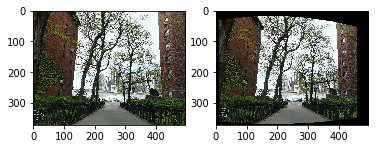

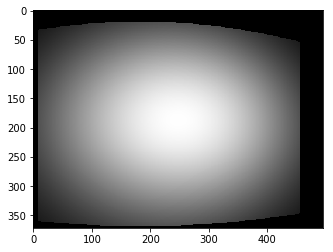

In [114]:

K_down=K/8
K_down[2][2]=1

theta1_0=0
phi1_0=0

img0 = cv2.imread("c0/imgr0.jpg",1)
img1 = cv2.imread("c0/imgr+1.jpg",1)

edge = 0
offset = getOffset(K_down,phi1_0)

sph0,mask0 = resize_SphericalWarping(img0,K_down,theta1_0,phi1_0,offset,edge)
# output,mask = resize_SphericalWarping(img0,K_down,theta1_0,phi1_0,500,250)

plt.figure()
plt.imshow(cv2.cvtColor(mask0, cv2.COLOR_BGR2RGB))  #(output * 255).astype(np.uint8)
plt.show()

# # sph1_padded = cv2.copyMakeBorder(sph1,100,100,100,100,cv2.BORDER_CONSTANT)
# output0,theta1_1,phi1_1 = twoImage(sph0,img1,K_down,theta1_0,phi1_0,offset,edge,"affine")
# theta1 = theta1_0+theta1_1
# phi1 = phi1_0+phi1_1

# offset = getOffset(K_down,phi1_1)

# output1,theta1_2,phi1_2 = twoImage(output,img1,K_down,theta1,phi1,offset,edge,"homography")


In [18]:
def resize_SphericalWarping(img1,K_down,theta_i,phi_i,offset,edge):


    img1 = cv2.resize(img1, (0,0), fx=0.125,fy=0.125,interpolation=cv2.INTER_LINEAR)
#     img1 = cv2.copyMakeBorder(img1,edge,edge,edge,edge,cv2.BORDER_CONSTANT)

    sph1,mask1 = sphericalWarpImage(img1, K_down, theta_i, phi_i,offset,edge)
    
    sph1 = sph1.astype(np.uint8)

    showImages(img1,sph1)
    return sph1,mask1

In [9]:
def getThetaAndPhi(affineMatrix,theta_i,phi_i):
    # print(affineMatrix)
    Tx = affineMatrix[0][2]
    Ty = affineMatrix[1][2]
    theta_i =2*math.atan(Tx/(2*K_down[0][0]))           #+ Tx/K_down[0][0]
    phi_i = 2*math.atan(Ty/(2*K_down[1][1]))
    
    return theta_i,phi_i

In [10]:
def getOffset(K_down,phi_i):
    fx = K_down[0,0]
    fy = K_down[1,1]
    x_c = K_down[0,2]
    y_c = K_down[1,2]
    # compute the offset, apply the offset to both picture
    offset = math.fabs(phi_i)/math.fabs(( 0 - y_c) / fy)*fy/2
    offset = int(offset+offset/3)
    print("offset= ",offset)
    return offset

In [11]:
def stitching(c1, c2, method):

    
    gray1= cv2.cvtColor(c1,cv2.COLOR_BGR2GRAY)
    gray2= cv2.cvtColor(c2,cv2.COLOR_BGR2GRAY)


    sift = cv2.xfeatures2d.SIFT_create()

    ################################################ TODO ###############################################
    # use sift.detect to detect features in the images
    kp1 = sift.detect(gray1,None)
    kp2 = sift.detect(gray2,None)

    img1_kps = cv2.drawKeypoints(gray1,kp1,None,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    img2_kps = cv2.drawKeypoints(gray2,kp2,None,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    ################################################ TODO ###############################################
    # use sift.compute to generate sift descriptors
    (kp1, features1) = sift.compute(gray1,kp1)
    (kp2, features2) = sift.compute(gray2,kp2)


    kp1 = np.float32([kp.pt for kp in kp1])
    kp2 = np.float32([kp.pt for kp in kp2])

    matcher = cv2.DescriptorMatcher_create("BruteForce")
    ################################################ TODO ###############################################
    # use knnMatch function in matcher to find corresonding features
    rawMatches = matcher.knnMatch(features1,features2,k=2)
    matches = []

    for m in rawMatches:
        # ensure the distance is within a certain ratio of each
        # other (i.e. Lowe's ratio test)
        ################################################ TODO ###############################################
        if len(m) == 2 and m[0].distance<0.7*m[1].distance: # complete the if statement.test the distance between points. use m[0].distance and m[1].distance
            matches.append((m[0].trainIdx, m[0].queryIdx))

    # print(matches)

    ptsA = np.float32([kp1[i] for (_,i) in matches])
    ptsB = np.float32([kp2[i] for (i,_) in matches])

    # print(ptsA)
    ################################################ TODO ###############################################
    ############src-->ptsB, dst------>ptsA
    #affine
    if method=="affine":
        (matrix, status) = cv2.estimateAffine2D(ptsB, ptsA, cv2.RANSAC, ransacReprojThreshold=5.0)
        result = cv2.warpAffine(c2, matrix, (c1.shape[1],c1.shape[0]))
    elif method=="homography":
        (matrix, status) = cv2.findHomography(ptsB, ptsA, cv2.RANSAC, 5.0)
        result = cv2.warpPerspective(c2, matrix, (c1.shape[1],c1.shape[0]))
    
    
    result = result.astype(np.uint8)
    
    
    
    
    vis = drawMatches(c1,c2,kp1,kp2,matches,status)
    plt.figure()
    plt.imshow(vis)
    plt.title('one to one correspondance between images')
    plt.show()
    
    #homography
    # (H, status) = cv2.findHomography(ptsB,ptsA,cv2.RANSAC) # fill in the parameters 
    # result = cv2.warpPerspective(img2,H,(img1.shape[1] + img2.shape[1], img1.shape[0]))# fill in the arguments to warp the second image to fit the first image.
    # result[0:c1.shape[0], 0:c1.shape[1]] = c1

#     output = np.zeros(result.shape)
#     x,y = result.shape[:2]
# #     print(result.shape)
#     for i in range(x):
#         for j in range(y):
#             if c1[i][j].all()== 0 and result[i][j].all()==0:
#                 output[i][j]=[0,0,0]
#             elif c1[i][j].all()==0 and result[i][j].all()!=0:
#                 output[i][j] = result[i][j]
#             elif result[i][j].all()==0 and c1[i][j].all()!=0:
#                 output[i][j] = c1[i][j]
#             else:
#                 output[i][j] = c1[i][j]
                
                
                
#                 output[i][j][0]= (int(int(c1[i][j][0]) + int(result[i][j][0]))/2) 
#                 output[i][j][1]= (int(int(c1[i][j][1]) + int(result[i][j][1]))/2) 
#                 output[i][j][2]= (int(int(c1[i][j][2]) + int(result[i][j][2]))/2) 

#     output= output.astype(np.uint8)




#     plt.figure()
#     plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))  #(output * 255).astype(np.uint8)
#     plt.title('stitched image')
#     plt.show()

    return result,matrix

In [12]:
def Laplacian_blending(img1,img2,mask,levels=4):

    G1 = img1.copy()
    G2 = img2.copy()
    GM = mask.copy()
    gp1 = [G1]
    gp2 = [G2]
    gpM = [GM]
    for i in range(levels):
        G1 = cv2.pyrDown(G1)
        G2 = cv2.pyrDown(G2)
        GM = cv2.pyrDown(GM)
        gp1.append(np.float32(G1))
        gp2.append(np.float32(G2))
        gpM.append(np.float32(GM))

    # generate Laplacian Pyramids for A,B and masks
    lp1  = [gp1[levels-1]] # the bottom of the Lap-pyr holds the last (smallest) Gauss level
    lp2  = [gp2[levels-1]]
    gpMr = [gpM[levels-1]]
    for i in range(levels-1,0,-1):
        # Laplacian: subtarct upscaled version of lower level from current level
        # to get the high frequencies
        L1 = np.subtract(gp1[i-1], cv2.pyrUp(gp1[i])[0:gp1[i-1].shape[0],0:gp1[i-1].shape[1]])
        L2 = np.subtract(gp2[i-1], cv2.pyrUp(gp2[i])[0:gp2[i-1].shape[0],0:gp2[i-1].shape[1]])
        lp1.append(L1)
        lp2.append(L2)
        gpMr.append(gpM[i-1]) # also reverse the masks
            
            # Now blend images according to mask in each level
    LS = []
    for l1,l2,gm in zip(lp1,lp2,gpMr):
        ls = l1 * gm + l2 * (1.0 - gm)
        LS.append(ls)

    # now reconstruct
    ls_ = LS[0]
    for i in range(1,levels):
        ls_ = cv2.pyrUp(ls_)[0:LS[i].shape[0],0:LS[i].shape[1]]
        ls_ = np.add(ls_, LS[i])

    return ls_

In [13]:
def alpha_blending(img1,img2,mask):
    # Convert uint8 to float
    foreground = img1.astype(float)
    background = img2.astype(float)
    
    plt.figure()
    plt.imshow(cv2.cvtColor(mask.astype(np.uint8), cv2.COLOR_BGR2RGB))  #(output * 255).astype(np.uint8)
    plt.title('stitched image')
    plt.show()
    # Normalize the alpha mask to keep intensity between 0 and 1
    alpha = mask.astype(float)/255

    # Multiply the foreground with the alpha matte
    foreground = cv2.multiply(alpha, foreground)

    # Multiply the background with ( 1 - alpha )
    background = cv2.multiply(1.0 - alpha, background)

    # Add the masked foreground and background.
    outImage = cv2.add(foreground, background)
    
    return outImage

In [19]:
def twoImage(output_prev,sph_previous,img_current,K_down,theta_i,phi_i,offset,edge,method,stitchingFlag):
        
    sph_cur_rotated,sph_cur_mask = resize_SphericalWarping(img_current,K_down,theta_i,phi_i,offset,edge)

    warpedImage,matrix = stitching(sph_previous,sph_cur_rotated,method)
    
    theta_i,phi_i = getThetaAndPhi(matrix,theta_i,phi_i)
    print("theta",theta_i/math.pi*180,"phi",phi_i/math.pi*180)
    
    if method == "affine":
        mask = cv2.warpAffine(sph_cur_mask, matrix, (output_prev.shape[1],output_prev.shape[0]))
    elif method == "homography":
        mask = cv2.warpPerspective(sph_cur_mask, matrix, (output_prev.shape[1],output_prev.shape[0]))
    
    
    if stitchingFlag:

#         output = Laplacian_blending(warpedImage,output_prev,mask,levels=4)
        output = alpha_blending(warpedImage,output_prev,mask)
        output = output.astype(np.uint8)

        plt.figure()
        plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))  #(output * 255).astype(np.uint8)
        plt.title('stitched image')
        plt.show()

    else:
        output = None
        


    #=======================================
#     sph2_rotated = resize_SphericalWarping(img2,K_down,theta_i,phi_i,offset+200)

#     sphericalOutput2,affineMatrix = stitching(sph1,sph2_rotated)
    
#     theta_i,phi_i = getThetaAndPhi(affineMatrix,theta_i,phi_i)
#     print(phi_i/math.pi*180)

    return output,warpedImage,theta_i,phi_i


In [23]:
def verticalStitching(img_current,img_previous,output_i,warpedImage_i,theta1,phi1,K_down,upFlag):
    
    offset = int(upFlag)*getOffset(K_down,phi1)

    edge = 0

    sph_previous,mask1 = resize_SphericalWarping(img_previous,K_down,theta1,phi1,offset,edge)

    (output_none,warped,theta2_1,phi2_1) = twoImage(output_i,sph_previous,img_current,K_down,theta1,phi1,offset,edge,"affine",False)

    theta2 = theta1 + theta2_1
    phi2 = phi1 + phi2_1
    offset = int(upFlag)*getOffset(K_down,phi2)

    output2,warped,theta2_2,phi2_2 = twoImage(output_i,warpedImage_i,img_current,K_down,theta2,phi2,offset,edge,"affine",True)
    
    return output2,warped,theta2, phi2

(1372, 996, 3)


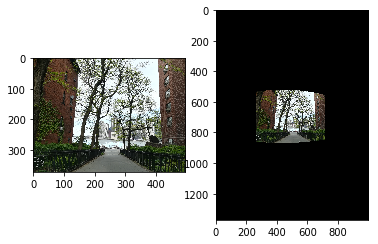

offset=  0
(372, 496, 3)


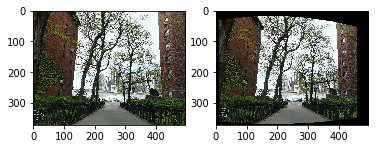

(372, 496, 3)


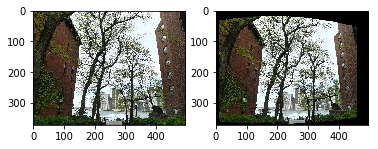

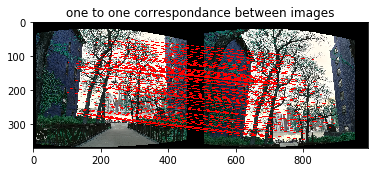

theta 0.5863136967976676 phi -6.888543015832463
offset=  66
(438, 628, 3)


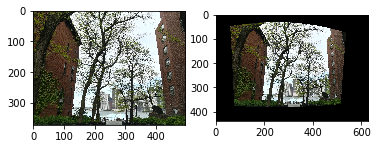

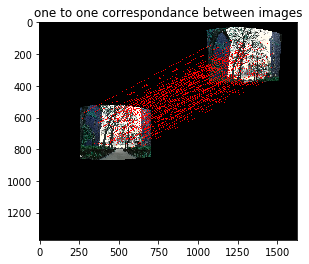

theta 23.807717637275793 phi 52.017761870077166


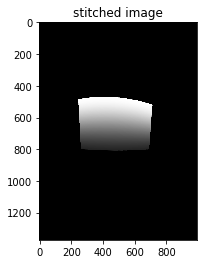

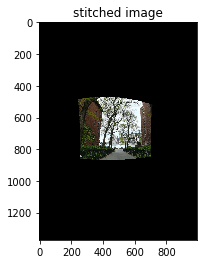

offset=  66
(438, 628, 3)


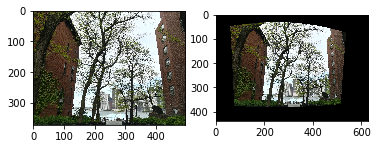

(438, 628, 3)


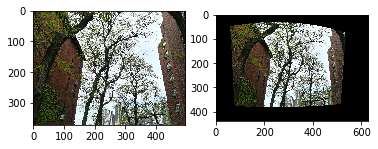

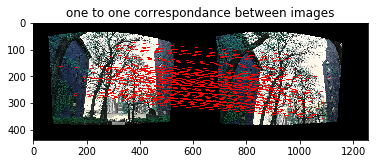

theta -1.1987041465799575 phi -5.821415122091067
offset=  121
(493, 738, 3)


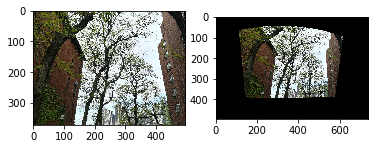

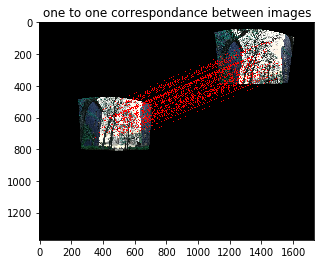

theta 14.384086138715881 phi 46.71143227722622


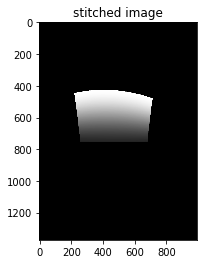

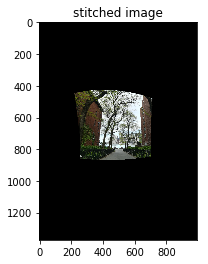

offset=  121
(493, 738, 3)


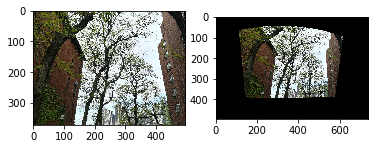

(493, 738, 3)


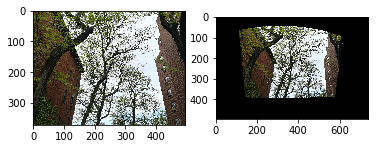

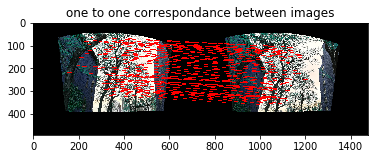

theta -1.0187077134273557 phi -4.186158449745097
offset=  162
(534, 820, 3)


KeyboardInterrupt: 

In [108]:
K_down=K/8
K_down[2][2]=1
theta_i=0
phi_i=0

img0 = cv2.imread("c0/imgr0.jpg",1)
images_up = glob.glob("c0/imgr+*.jpg")
images_down=glob.glob("c0/imgr-*.jpg")

sph0,mask_out = resize_SphericalWarping(img0,K_down,theta_i,phi_i,500,250)

output_i = sph0
warpedImage_i = sph0
img_previous = img0


output = []
for fname in images_up:
    img_current = cv2.imread(fname,1)
    output_i,warpedImage_i,theta_i,phi_i = verticalStitching(img_current,img_previous,output_i,warpedImage_i,theta_i,phi_i,K_down,1)
    output.append(output_i)
    img_previous = img_current

img_previous = img0
warpedImage_i = sph0
theta_i=0
phi_i=0

for fname in images_down:
    img_current = cv2.imread(fname,1)
    output_i,warpedImage_i,theta_i,phi_i = verticalStitching(img_current,img_previous,output_i,warpedImage_i,theta_i,phi_i,K_down,-1)
    output.append(output_i)
    img_previous = img_current
   

In [90]:
print(len(output))
cv2.imwrite('output.png',output[9])

10


True

offset=  0
(372, 496, 3)


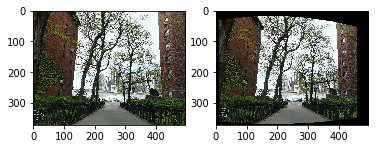

(372, 496, 3)


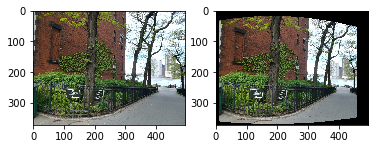

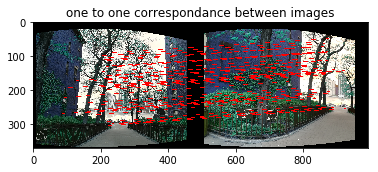

theta -22.72060557988309 phi 5.5876835828282685


In [35]:

K_down=K/8
K_down[2][2]=1

theta1_0=0
phi1_0=0

img0 = cv2.imread("c0/imgr0.jpg",1)
img1 = cv2.imread("c1/imgr0.jpg",1)

edge = 0
offset = getOffset(K_down,phi1_0)

sph0,mask0 = resize_SphericalWarping(img0,K_down,theta1_0,phi1_0,offset,edge)
sph1,mask1 = resize_SphericalWarping(img1,K_down,theta1_0,phi1_0,offset,edge)

warped,matrix = stitching(sph0,sph1,"affine")

theta0,phi0 = getThetaAndPhi(matrix,theta1_0,phi1_0)
print("theta",theta0/math.pi*180,"phi",phi0/math.pi*180)

offset=  0
(372, 496, 3)


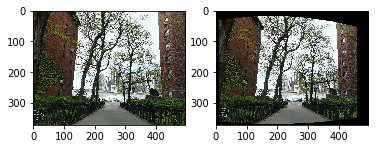

(372, 496, 3)


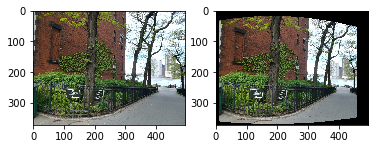

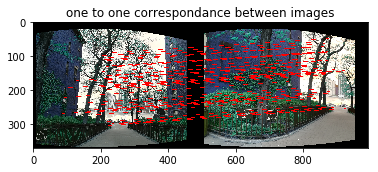

theta -22.72060557988309 phi 5.5876835828282685
(1372, 996, 3)


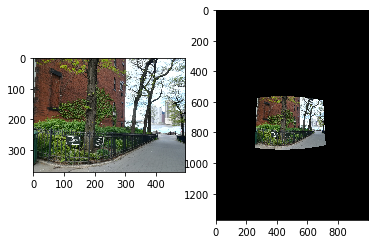

offset=  53
(425, 602, 3)


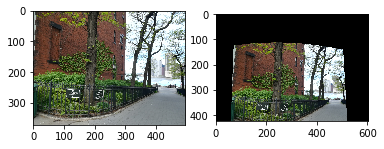

(425, 602, 3)


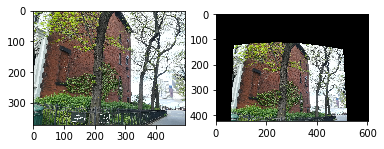

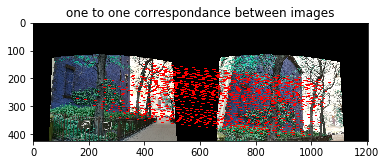

theta -0.915663771044661 phi -8.741633084071449
offset=  30
(402, 556, 3)


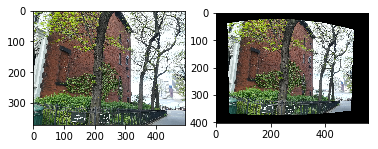

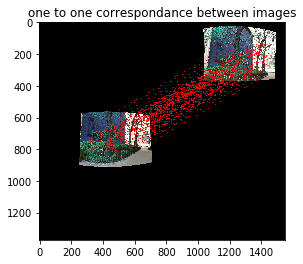

theta 23.820249861765873 phi 55.870174750716686


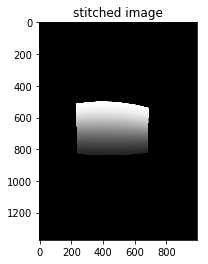

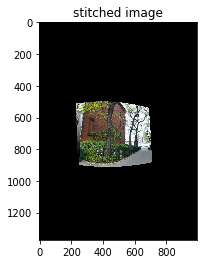

offset=  30
(402, 556, 3)


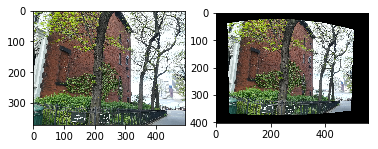

(402, 556, 3)


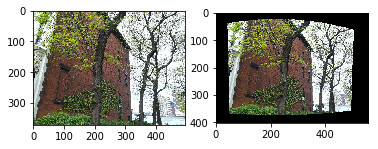

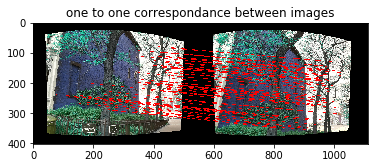

theta 3.0996428028212355 phi -7.043165802047214
offset=  97
(469, 690, 3)


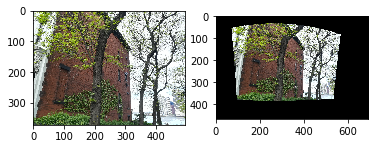

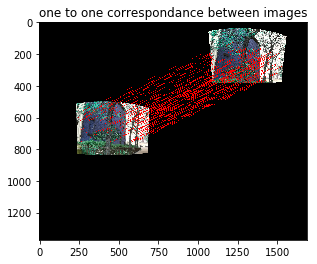

theta 19.248702879725748 phi 49.22323977762178


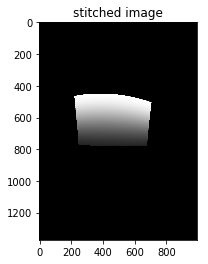

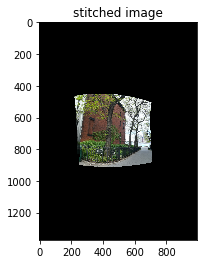

offset=  97
(469, 690, 3)


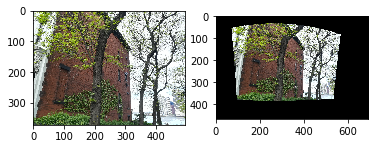

(469, 690, 3)


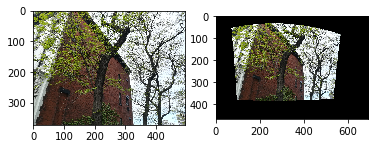

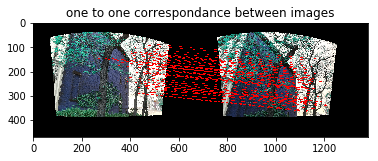

theta 0.7542947193484606 phi -10.286082631886025
offset=  196
(568, 888, 3)


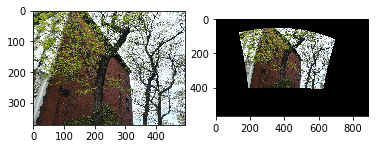

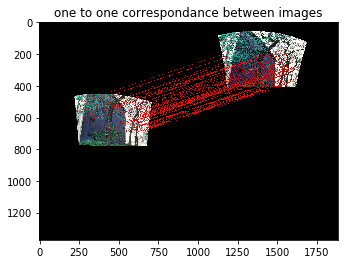

theta 7.690577857427551 phi 40.218006907377244


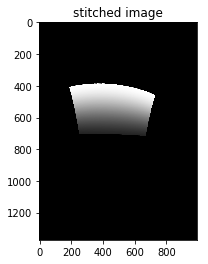

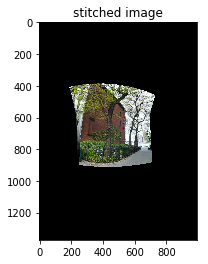

offset=  196
(568, 888, 3)


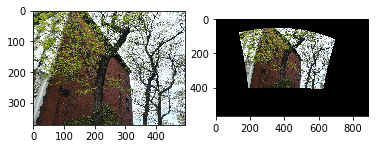

(568, 888, 3)


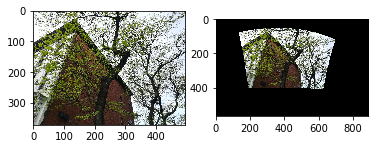

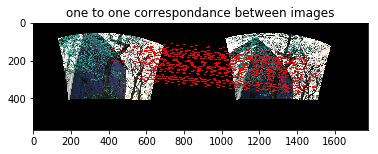

theta -1.5025477731048498 phi -11.038091620703918
offset=  302
(674, 1100, 3)


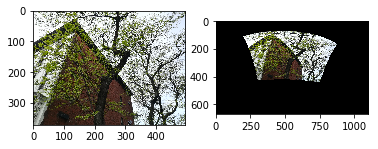

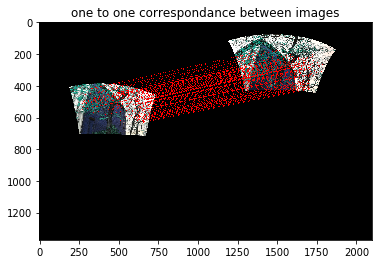

theta -6.942813857802122 phi 31.199533405238963


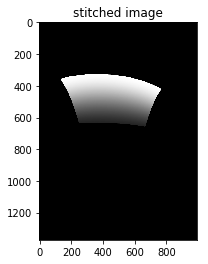

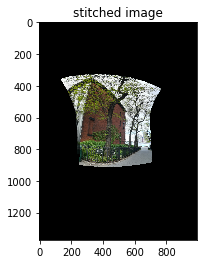

offset=  302
(674, 1100, 3)


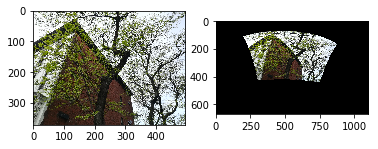

(674, 1100, 3)


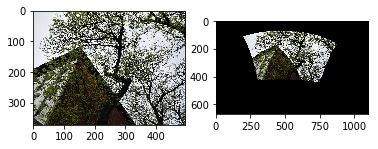

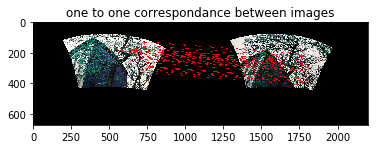

theta -7.2560482543852824 phi -11.295544162739207
offset=  410
(782, 1316, 3)


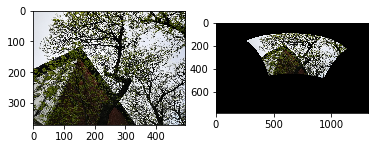

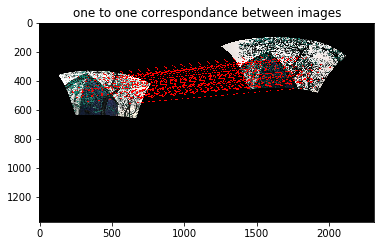

theta -28.55875874948685 phi 22.804209833662277


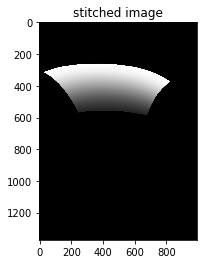

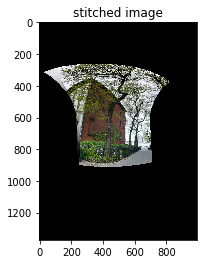

offset=  0
(372, 496, 3)


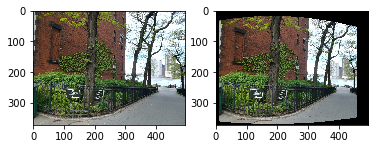

(372, 496, 3)


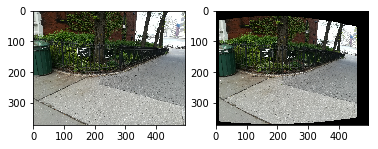

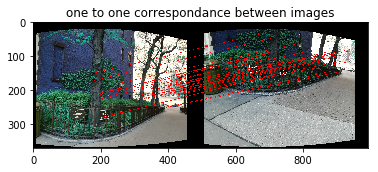

theta -3.5751165054078937 phi 18.171983907377324
offset=  174
(546, 844, 3)


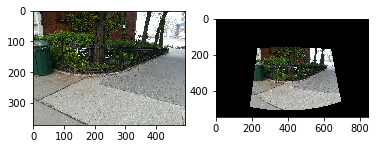

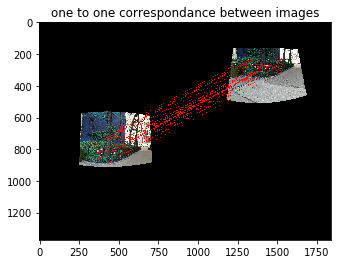

theta 1.8727727821695388 phi 59.86704353061301


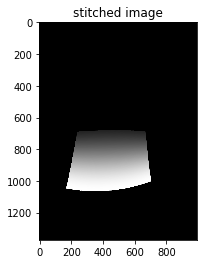

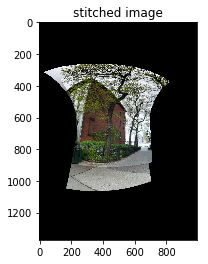

offset=  174
(546, 844, 3)


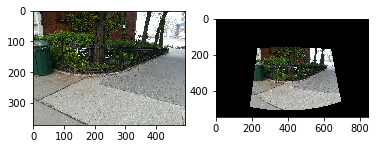

(546, 844, 3)


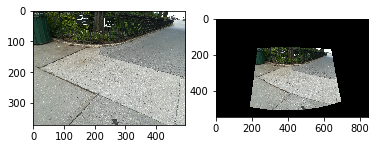

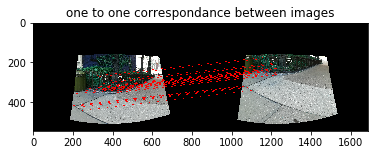

theta 0.5962732984793874 phi 10.645472925354838
offset=  276
(648, 1048, 3)


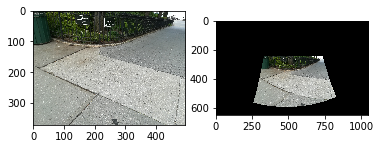

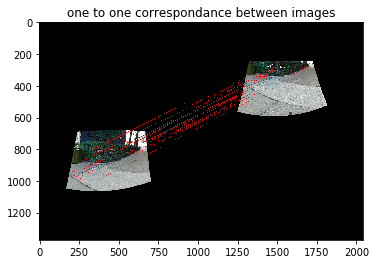

theta -9.759054132816301 phi 60.439361288148916


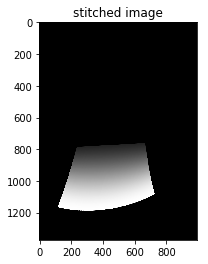

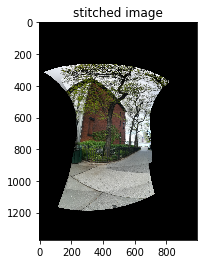

offset=  276
(648, 1048, 3)


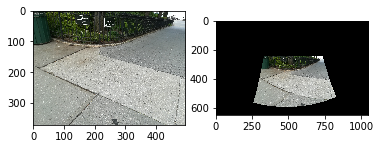

(648, 1048, 3)


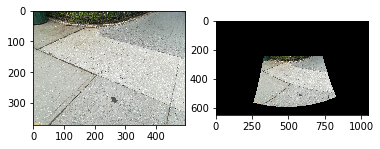

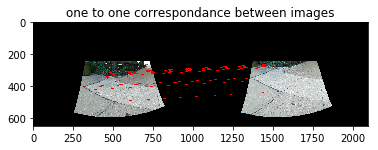

theta -0.5131384223460134 phi 5.2003683309518385
offset=  326
(698, 1148, 3)


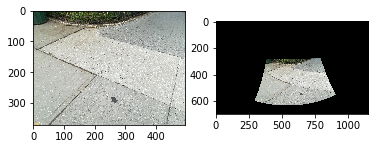

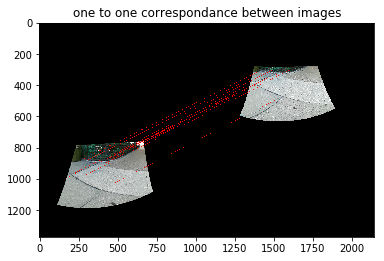

theta -17.08122410059408 phi 61.11875357578497


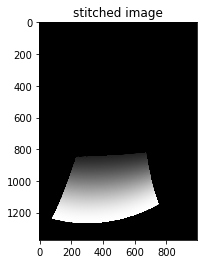

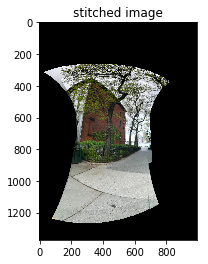

offset=  326
(698, 1148, 3)


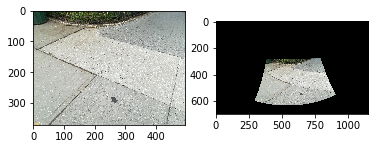

(698, 1148, 3)


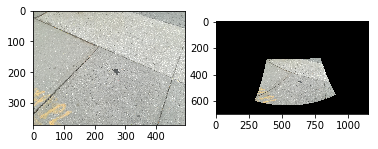

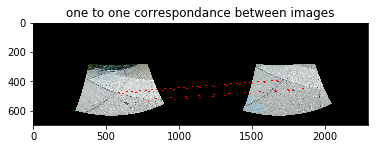

theta -9.375462957982073 phi 11.48580829322821
offset=  436
(808, 1368, 3)


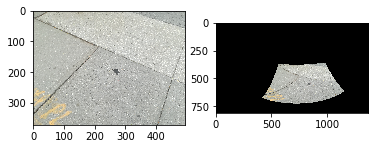

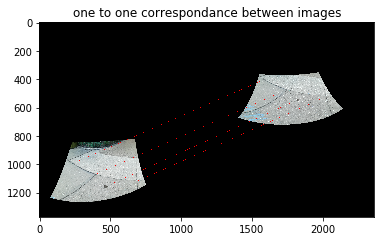

theta -39.696695221985856 phi 60.815561391351004


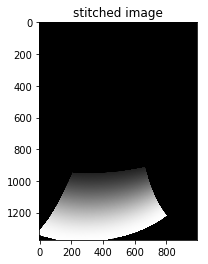

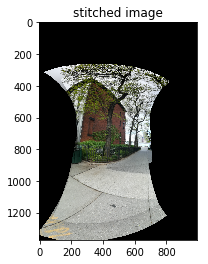

In [93]:

K_down=K/8
K_down[2][2]=1

theta1_0=0
phi1_0=0

img0 = cv2.imread("c0/imgr0.jpg",1)
img1 = cv2.imread("c1/imgr0.jpg",1)

edge = 0
offset = getOffset(K_down,phi1_0)

sph0,mask0 = resize_SphericalWarping(img0,K_down,theta1_0,phi1_0,offset,edge)
sph1,mask1 = resize_SphericalWarping(img1,K_down,theta1_0,phi1_0,offset,edge)

warped,matrix = stitching(sph0,sph1,"affine")

theta0,phi0 = getThetaAndPhi(matrix,theta1_0,phi1_0)
print("theta",theta0/math.pi*180,"phi",phi0/math.pi*180)

#==========================================================

theta_i=0
phi_i=phi0

img0 = cv2.imread("c1/imgr0.jpg",1)
images_up = glob.glob("c1/imgr+*.jpg")
images_down=glob.glob("c1/imgr-*.jpg")

sph0,mask_out = resize_SphericalWarping(img0,K_down,theta_i,phi_i,500,250)

output_i = sph0
warpedImage_i = sph0
img_previous = img0


output1 = []
for fname in images_up:
    img_current = cv2.imread(fname,1)
    output_i,warpedImage_i,theta_i,phi_i = verticalStitching(img_current,img_previous,output_i,warpedImage_i,theta_i,phi_i,K_down,1)
    output1.append(output_i)
    img_previous = img_current

img_previous = img0
warpedImage_i = sph0
theta_i=0
phi_i=0

for fname in images_down:
    img_current = cv2.imread(fname,1)
    output_i,warpedImage_i,theta_i,phi_i = verticalStitching(img_current,img_previous,output_i,warpedImage_i,theta_i,phi_i,K_down,-1)
    output1.append(output_i)
    img_previous = img_current
   

In [94]:
print(len(output1))
cv2.imwrite('output1_0.png',output1[8])

# plt.imshow(cv2.cvtColor(output_i, cv2.COLOR_BGR2RGB))
# plt.savefig("output.png",bbox_inches='tight')

9


True

offset=  0
(372, 496, 3)


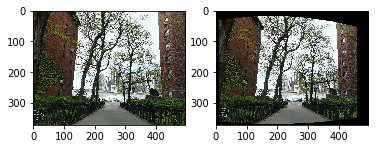

(372, 496, 3)


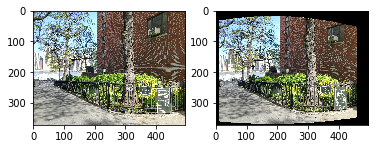

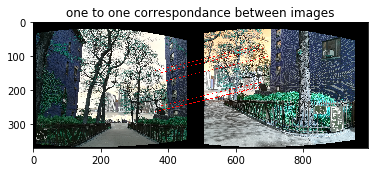

theta 26.55690636567431 phi 10.2531715943727
(1372, 996, 3)


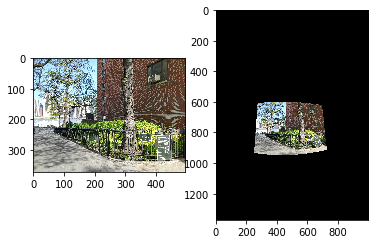

offset=  98
(470, 692, 3)


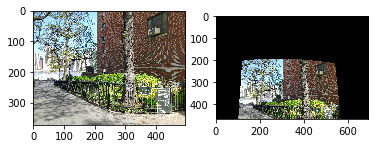

(470, 692, 3)


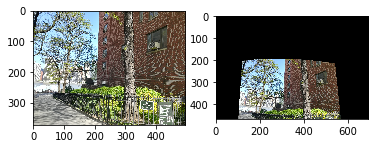

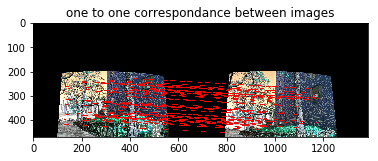

theta -1.3429955995545864 phi -3.537716728471886
offset=  64
(436, 624, 3)


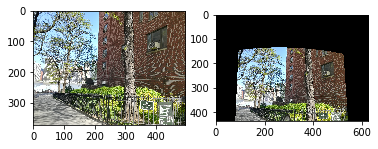

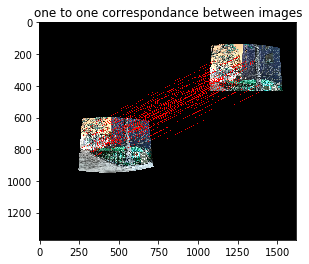

theta 20.9744689383197 phi 52.06699701501122


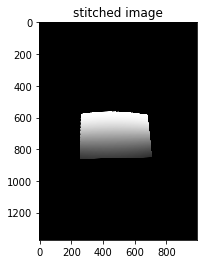

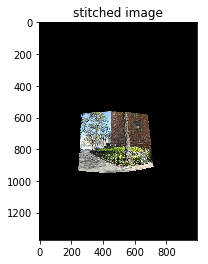

offset=  64
(436, 624, 3)


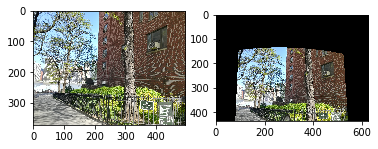

(436, 624, 3)


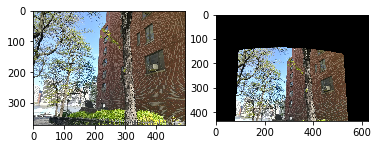

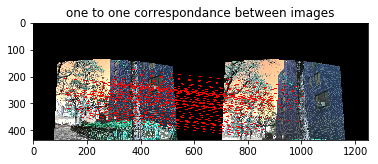

theta -1.2816281586686873 phi -6.420531212301184
offset=  2
(374, 500, 3)


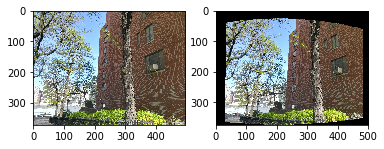

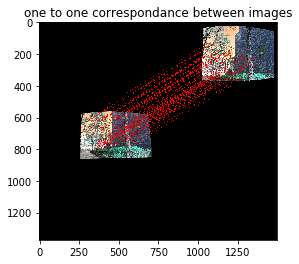

theta 26.982109145638418 phi 57.21615172999914


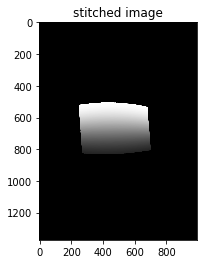

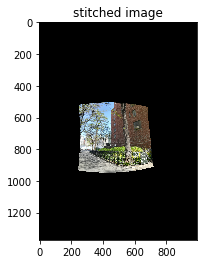

offset=  2
(374, 500, 3)


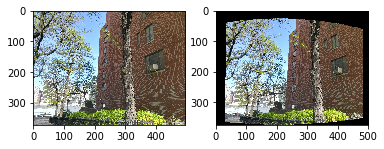

(374, 500, 3)


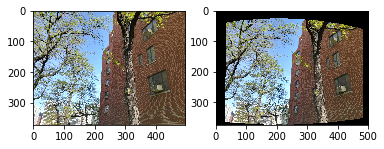

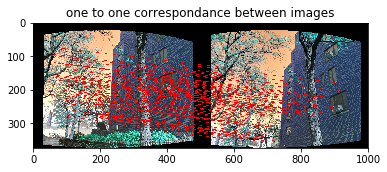

theta -2.4984095642481323 phi -6.911132841397761
offset=  63
(435, 622, 3)


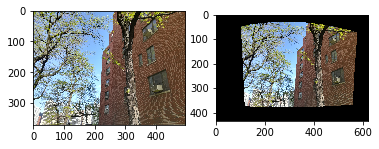

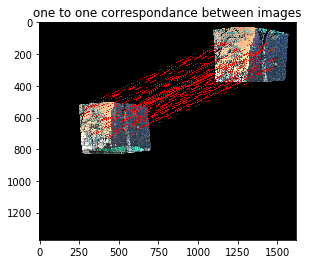

theta 15.25348043644162 phi 50.97903897816122


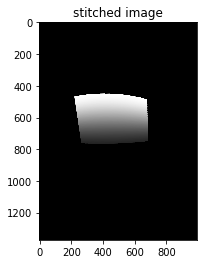

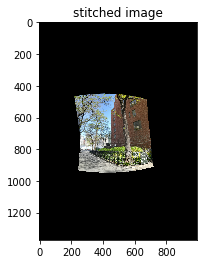

offset=  63
(435, 622, 3)


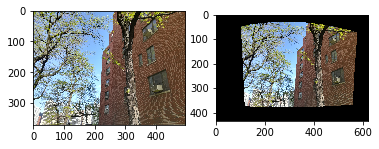

(435, 622, 3)


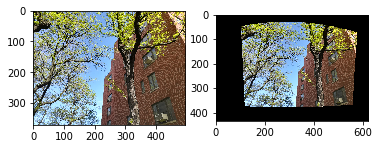

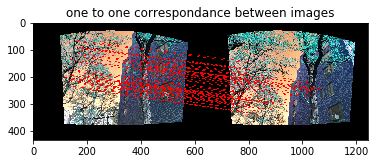

theta -4.6527138952397555 phi -9.085216552590955
offset=  150
(522, 796, 3)


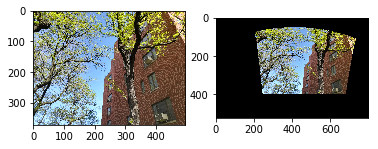

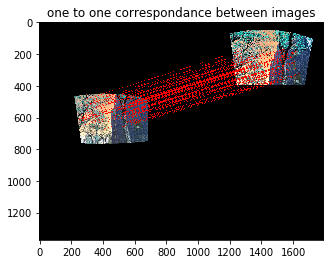

theta -2.1548250544540397 phi 42.30339134085338


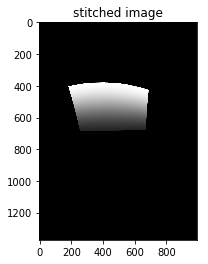

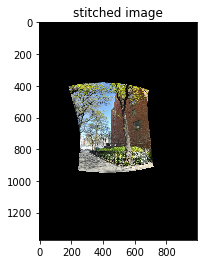

offset=  150
(522, 796, 3)


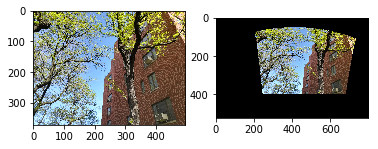

(522, 796, 3)


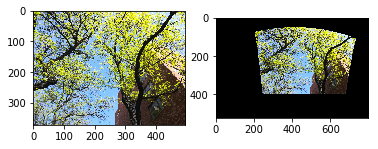

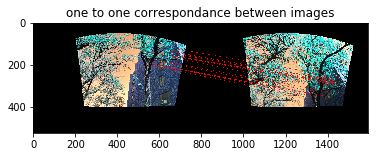

theta 3.644174731713634 phi -27.17981726569511
offset=  411
(783, 1318, 3)


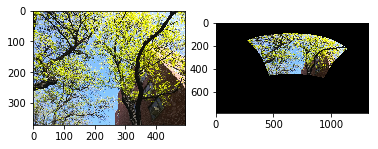

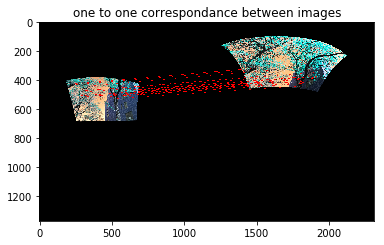

theta -30.521844102060438 phi 20.717672271610027


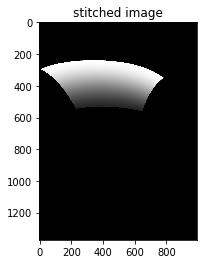

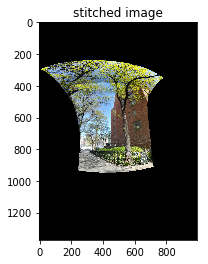

offset=  0
(372, 496, 3)


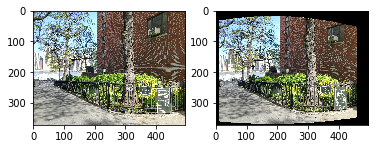

(372, 496, 3)


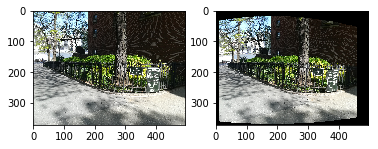

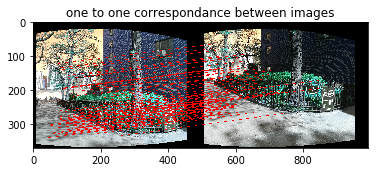

theta 5.476254064568795 phi 7.04314967919211
offset=  67
(439, 630, 3)


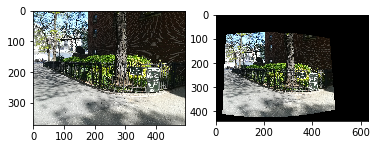

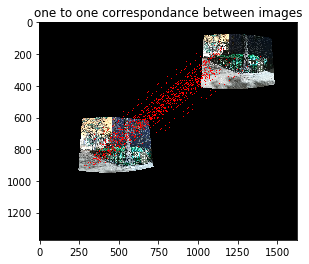

theta 33.382974706249605 phi 66.42381026912585


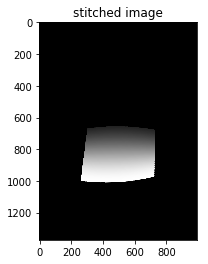

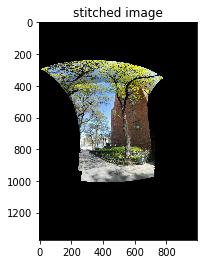

offset=  67
(439, 630, 3)


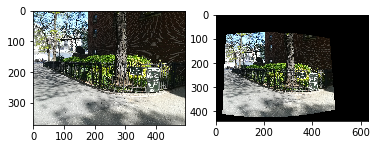

(439, 630, 3)


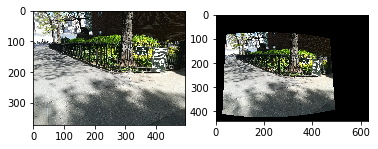

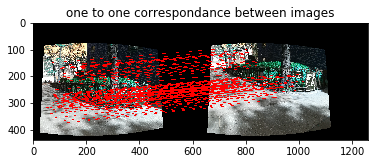

theta -1.486751949382175 phi 6.023427447851371
offset=  125
(497, 746, 3)


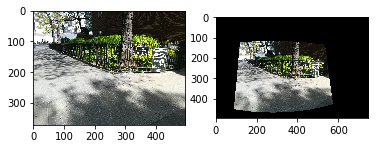

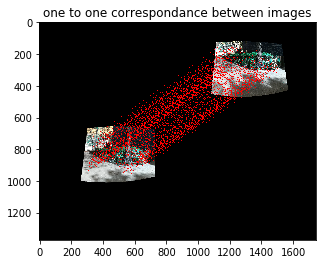

theta 23.116796079479702 phi 66.24831890422071


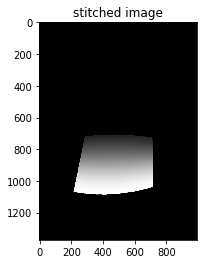

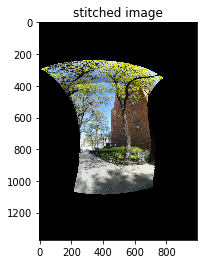

offset=  125
(497, 746, 3)


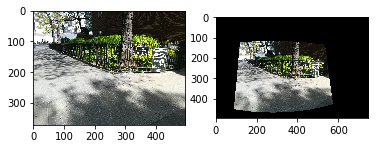

(497, 746, 3)


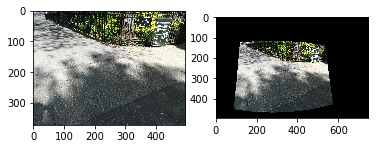

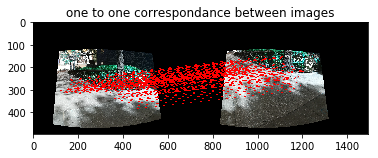

theta -0.673909426149954 phi 10.796733549776263
offset=  228
(600, 952, 3)


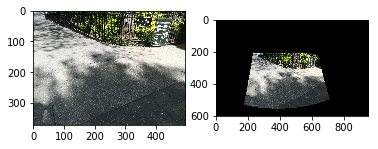

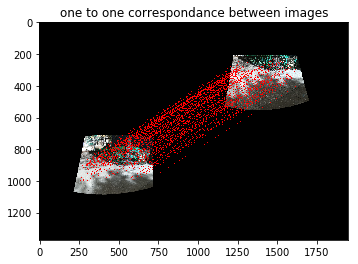

theta 9.707351889502515 phi 65.86649016638114


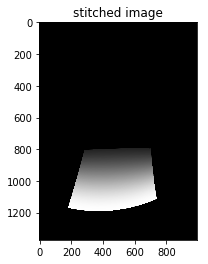

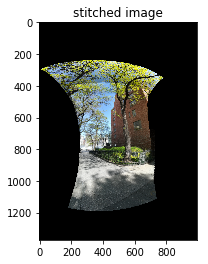

offset=  228
(600, 952, 3)


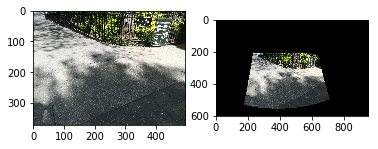

(600, 952, 3)


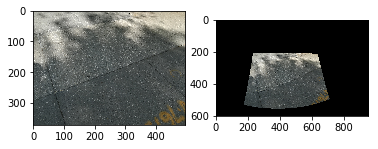

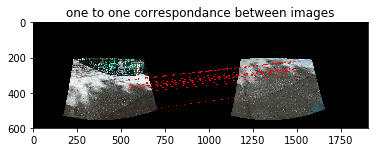

theta -2.7335531065453336 phi 20.32841551470849
offset=  423
(795, 1342, 3)


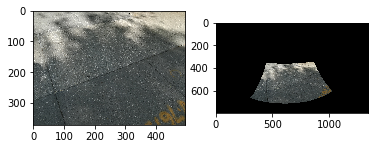

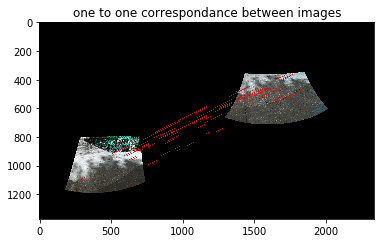

theta -9.077905200931188 phi 57.560896275204094


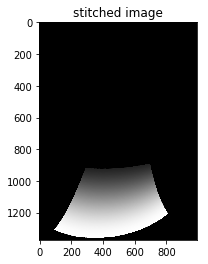

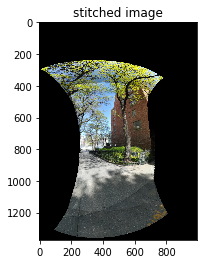

offset=  423
(795, 1342, 3)


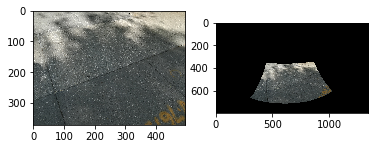

(795, 1342, 3)


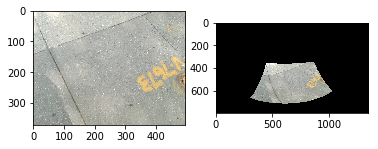

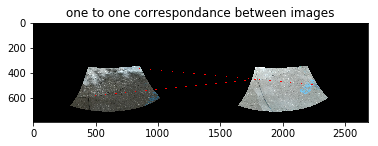

theta -60.62341899513092 phi -42.539285233951425
offset=  15
(387, 526, 3)


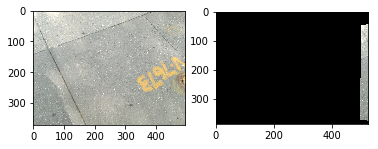

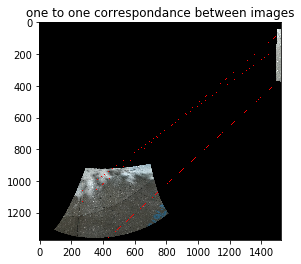

theta -157.60125838407043 phi -157.11088216056348


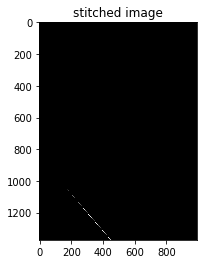

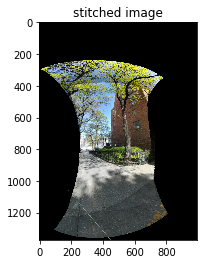

In [98]:

K_down=K/8
K_down[2][2]=1

theta1_0=0
phi1_0=0

img0 = cv2.imread("c0/imgr0.jpg",1)
img1 = cv2.imread("c12/imgr0.jpg",1)

edge = 0
offset = getOffset(K_down,phi1_0)

sph0,mask0 = resize_SphericalWarping(img0,K_down,theta1_0,phi1_0,offset,edge)
sph1,mask1 = resize_SphericalWarping(img1,K_down,theta1_0,phi1_0,offset,edge)

warped,matrix = stitching(sph0,sph1,"affine")

theta0,phi0 = getThetaAndPhi(matrix,theta1_0,phi1_0)
print("theta",theta0/math.pi*180,"phi",phi0/math.pi*180)


theta_i=-0
phi_i=phi0

img0 = cv2.imread("c12/imgr0.jpg",1)
images_up = glob.glob("c12/imgr+*.jpg")
images_down=glob.glob("c12/imgr-*.jpg")

sph0,mask_out = resize_SphericalWarping(img0,K_down,theta_i,phi_i,500,250)

output_i = sph0
warpedImage_i = sph0
img_previous = img0


output12 = []
for fname in images_up:
    img_current = cv2.imread(fname,1)
    output_i,warpedImage_i,theta_i,phi_i = verticalStitching(img_current,img_previous,output_i,warpedImage_i,theta_i,phi_i,K_down,1)
    output12.append(output_i)
    img_previous = img_current

img_previous = img0
warpedImage_i = sph0
theta_i=0
phi_i=0

for fname in images_down:
    img_current = cv2.imread(fname,1)
    output_i,warpedImage_i,theta_i,phi_i = verticalStitching(img_current,img_previous,output_i,warpedImage_i,theta_i,phi_i,K_down,-1)
    output12.append(output_i)
    img_previous = img_current
   

In [100]:
print(len(output12))
cv2.imwrite('output12.png',output12[len(output12)-1])

# plt.imshow(cv2.cvtColor(output_i, cv2.COLOR_BGR2RGB))
# plt.savefig("output.png",bbox_inches='tight')

10


True

502928 [1 1 1] 1347 668


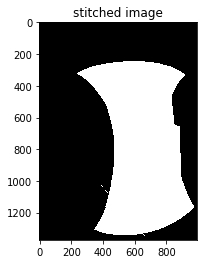

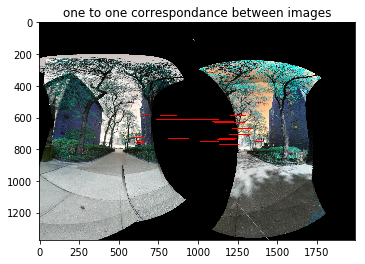

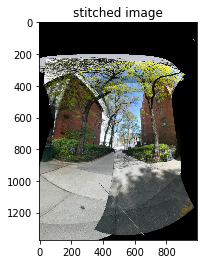

True

In [102]:
col_0 = cv2.imread('output_hor.png',1)
col_1 = cv2.imread('output12.png',1)

output_hor,matrix = horizontal_stitching(col_0,col_1)
cv2.imwrite('output_hor_12.png',output_hor)


# gray1= cv2.cvtColor(col_1,cv2.COLOR_BGR2GRAY)

# (h,w) = gray1.shape

# mask_1 = np.zeros_like(col_1)
# for i in range(h):
#     for j in range(w):
#         if gray1[i][j] != 0:
#             mask_1[i][j]==1
            
            
# warpedImage,matrix = stitching(col_0,col_1,"affine")

# theta_i,phi_i = getThetaAndPhi(matrix,0,0)
# print("theta",theta_i/math.pi*180,"phi",phi_i/math.pi*180)

# mask = cv2.warpAffine(mask_1, matrix, (col_0.shape[1],col_0.shape[0]))


# output = Laplacian_blending(col_0,col_1,mask,levels=4)
# output = output.astype(np.uint8)

# plt.figure()
# plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))  #(output * 255).astype(np.uint8)
# plt.title('stitched image')
# plt.show()


In [76]:
def horizontal_stitching(c1,c2):

    
    gray1= cv2.cvtColor(c1,cv2.COLOR_BGR2GRAY)
    gray2= cv2.cvtColor(c2,cv2.COLOR_BGR2GRAY)


    sift = cv2.xfeatures2d.SIFT_create()

    ################################################ TODO ###############################################
    # use sift.detect to detect features in the images
    kp1 = sift.detect(gray1,None)
    kp2 = sift.detect(gray2,None)

    img1_kps = cv2.drawKeypoints(gray1,kp1,None,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    img2_kps = cv2.drawKeypoints(gray2,kp2,None,flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    ################################################ TODO ###############################################
    # use sift.compute to generate sift descriptors
    (kp1, features1) = sift.compute(gray1,kp1)
    (kp2, features2) = sift.compute(gray2,kp2)


    kp1 = np.float32([kp.pt for kp in kp1])
    kp2 = np.float32([kp.pt for kp in kp2])

    matcher = cv2.DescriptorMatcher_create("BruteForce")
    ################################################ TODO ###############################################
    # use knnMatch function in matcher to find corresonding features
    rawMatches = matcher.knnMatch(features1,features2,k=2)
    matches = []

    for m in rawMatches:
        # ensure the distance is within a certain ratio of each
        # other (i.e. Lowe's ratio test)
        ################################################ TODO ###############################################
        if len(m) == 2 and m[0].distance<0.7*m[1].distance: # complete the if statement.test the distance between points. use m[0].distance and m[1].distance
            matches.append((m[0].trainIdx, m[0].queryIdx))

    # print(matches)

    ptsA = np.float32([kp1[i] for (_,i) in matches])
    ptsB = np.float32([kp2[i] for (i,_) in matches])

    # print(ptsA)
    ################################################ TODO ###############################################
    ############src-->ptsB, dst------>ptsA
    #affine
    (affineMatrix, status) = cv2.estimateAffine2D(ptsB, ptsA, cv2.RANSAC, ransacReprojThreshold=5.0)
    result = cv2.warpAffine(c2, affineMatrix, (c1.shape[1],c1.shape[0]))

    #homography
    # (H, status) = cv2.findHomography(ptsB,ptsA,cv2.RANSAC) # fill in the parameters 
    # result = cv2.warpPerspective(img2,H,(img1.shape[1] + img2.shape[1], img1.shape[0]))# fill in the arguments to warp the second image to fit the first image.
    # result[0:c1.shape[0], 0:c1.shape[1]] = c1

    output = np.zeros(result.shape)
    #=============================blending=============================
    gray1= cv2.cvtColor(result,cv2.COLOR_BGR2GRAY)
    (h,w) = gray1.shape
    index_i=0
    index_j=0
    num=0
    mask_1 = np.zeros_like(result)
    for i in range(h):
        for j in range(w):
            if gray1[i][j].all() != 0:
                mask_1[i][j][0]=1
                mask_1[i][j][1]=1
                mask_1[i][j][2]=1
                num = num+1
                index_i=i
                index_j=j
    print(num,mask_1[index_i][index_j],index_i,index_j)
                
    plt.figure()
    plt.imshow(cv2.cvtColor((mask_1*255).astype(np.uint8), cv2.COLOR_BGR2RGB))  #(output * 255).astype(np.uint8)
    plt.title('stitched image')
    plt.show()            
    output = Laplacian_blending(result,c1,mask_1,levels=2)
      
    #===================================================================
    output= output.astype(np.uint8)
    # for i in range(x):
    #     for j in range(y):
    #         if c1[i][j]==0 and result[i][j]==0:
    #             output[i][j]=0
    #         elif c1[i][j]==0 and result[i][j]!=0:
    #             output[i][j] = result[i][j]
    #         elif result[i][j]==0 and c1[i][j]!=0:
    #             output[i][j] = (c1[i][j])
    #         else:
    #             output[i][j]= (int(int(c1[i][j]) + int(output[i][j]))/2) 


    vis = drawMatches(c1,c2,kp1,kp2,matches,status)
    plt.figure()
    plt.imshow(vis)
    plt.title('one to one correspondance between images')
    plt.show()

    plt.figure()
    plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))  #(output * 255).astype(np.uint8)
    plt.title('stitched image')
    plt.show()

    return output,affineMatrix